# Imports Functions

In [12]:
%load_ext autoreload

import numpy as np

from scipy import io
from sklearn.decomposition import NMF

import Support_Functions as sf
import matplotlib.pyplot as plt

from sklearn import (decomposition, preprocessing as pre, cluster,
                     preprocessing, cluster, metrics,
                     model_selection, neighbors)
from matplotlib import (pyplot as plt, animation, colors,
                        ticker, path, patches, patheffects)
from matplotlib.ticker import FormatStrFormatter

from mpl_toolkits.axes_grid1 import make_axes_locatable

import keras
from keras.models import Sequential, Input, Model
from keras.layers import (Dense, Conv1D, Convolution2D, GRU, LSTM, Recurrent, Bidirectional, TimeDistributed,
                          Dropout, Flatten, RepeatVector, Reshape, MaxPooling1D, UpSampling1D, BatchNormalization)
from keras.layers.core import Lambda
from keras.optimizers import Adam

from os.path import join as pjoin

import glob
import os
import moviepy.editor as mpy


from tqdm import tqdm

from sklearn.metrics import mean_squared_error
from scipy.signal import savgol_filter as sg
from scipy import interpolate

%matplotlib inline

sf.custom_plt_format()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [152]:
import Support_Functions as sf
import imp
imp.reload(sf)

<module 'Support_Functions' from '/Users/joshuaagar/Google Drive/Berkeley_2017/Data_Analysis/Automatic_Analysis_of_Ferroelectric_Switching_Using_Deep_Recurrent_Neural_Networks/Support_Functions.py'>

# Loads the Data

In [153]:
# loads the data file
data = io.matlab.loadmat('./Data.mat')

# extracts the voltage vector
voltage = data['Voltagedata_mixed']

# extracts the hyteresis loopsb
Piezoresponse = data['Loopdata_mixed']
Amplitude = data['OutA2_mixed']
Phase = data['OutPhi1_mixed']
Resonance = data['Outw2_mixed']
Quality = data['OutQ2_mixed']

# interpolates missing points
Piezoresponse = sf.interpolate_missing_points(Piezoresponse).reshape(-1,Piezoresponse.shape[2])
Amplitude = sf.clean_and_interpolate(Amplitude)
Phase = sf.clean_and_interpolate(Phase)

# manually removes values which are too high or too low
for i in range(60):
    for j in range(60):
        low = Resonance[i,j] < 1300
        high =Resonance[i,j] > 1340
        outliers = np.where(low + high)
        Resonance[i,j,outliers] = np.nan
Resonance = sf.clean_and_interpolate(Resonance)
Quality = sf.clean_and_interpolate(Quality)

Piezo_norm = sf.normalize_data(Piezoresponse)

clean_resonance = np.copy(Resonance)
resonance_filtered = np.copy(Resonance)

for i in range(3600):
    sg_ = sg(Resonance[i], window_length=7, polyorder=3)
    diff = np.abs(Resonance[i]-sg_)
    sort_ind = np.argsort(diff)
    remove = sort_ind[-3::].astype(int)
    clean_resonance[i,remove] = np.nan
    true_ind = np.where(~np.isnan(clean_resonance[i]))
    point_values = np.linspace(0, 1, 96)
    spline = interpolate.InterpolatedUnivariateSpline(point_values[true_ind],
                                                      clean_resonance[i, true_ind].squeeze())
                        
    ind = np.where(np.isnan(clean_resonance[i]))
    val = spline(point_values[ind])
    resonance_filtered[i,ind] = spline(point_values[ind])

resonance_norm = sf.normalize_data(resonance_filtered)

# Topography and Piezoresponse

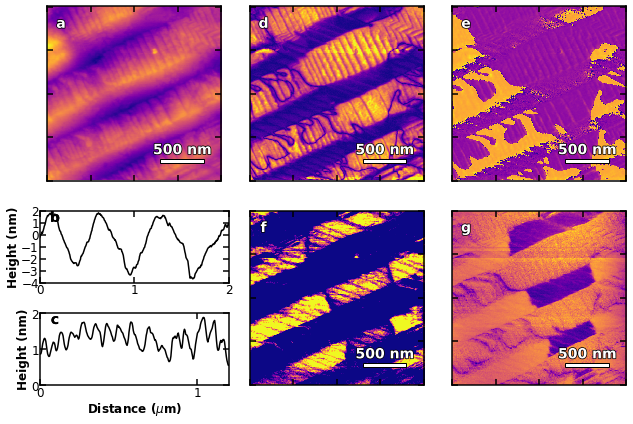

In [4]:
fig = plt.figure(figsize=(9, 6))

ax1 = plt.subplot2grid((4, 6), (0, 0), colspan=2, rowspan=2)
ax2 = plt.subplot2grid((4, 6), (2, 0), colspan=2, rowspan=1)
ax3 = plt.subplot2grid((4, 6), (3, 0), colspan=2, rowspan=1)
ax4 = plt.subplot2grid((4, 6), (0, 2), colspan=2, rowspan=2)
ax5 = plt.subplot2grid((4, 6), (0, 4), colspan=2, rowspan=2)
ax6 = plt.subplot2grid((4, 6), (2, 2), colspan=2, rowspan=2)
ax7 = plt.subplot2grid((4, 6), (2, 4), colspan=2, rowspan=2)

axes = (ax1, ax2, ax3, ax4, ax5, ax6, ax7)

signal_clim = {'Topography': dict(
    c_lim=[],
    data_loc='topo_mixed'),
    'Large-Periodicity Line Trace': dict(
    data_loc='topo_ca_caca_mixed',
    x_lim=[0, 2],
    y_lim=[-4, 2],
    shift=0),
    'Small-Periodicity Line Trace':  dict(
    data_loc='topo_mixed_caca',
    x_lim=[0, 1.2],
    y_lim=[0, 2],
    shift=0.8),
    'Vertical Amplitude': dict(
    c_lim=[0, 4.5e-10],
    data_loc='Vert_Amp_mixed'),
    'Vertical Phase': dict(
    c_lim=[],
    data_loc='vert_phase_mixed'),
    'Lateral Amplitude': dict(
    c_lim=[0, .8e-11],
    data_loc='lateral_amp_mixed'),
    'Lateral Phase': dict(
    c_lim=[],
    data_loc='lateral_phase_mixed')
}

# Plots each of the graphs
for i, (signal, values) in enumerate(signal_clim.items()):

    if 'Trace' not in signal:

        # Plots the graph
        im = axes[i].imshow(
            np.flipud(data[values['data_loc']].T), cmap='plasma')

        # Sets the scales
        if values['c_lim']:
            im.set_clim(values['c_lim'])

        # labels figures
        sf.labelfigs(axes[i], i)

        # Removes axis labels
        axes[i].set_xticklabels([])
        axes[i].set_yticklabels([])

        # Sets ticks
        axes[i].set_xticks(np.linspace(
            0, data[values['data_loc']].shape[0], 5))
        axes[i].set_yticks(np.linspace(
            0, data[values['data_loc']].shape[1], 5))

        sf.add_scalebar_to_figure(axes[i], 2000, 500)

    else:

        line_trace = data[values['data_loc']]
        plt1 = axes[i].plot(line_trace[:, 0] * 1e6 -
                            values['shift'], line_trace[:, 1] * 1e9, 'k')

        if 'Small' in signal:
            axes[i].set_xlabel('Distance (${\mu}$m)')

        axes[i].set_ylabel('Height (nm)')
        axes[i].set_xlim(values['x_lim'])
        axes[i].set_ylim(values['y_lim'])
        axes[i].set_xticks(np.arange(values['x_lim'][0],
                                     values['x_lim'][1] + .1, 1))
        axes[i].set_yticks(np.arange(values['y_lim'][0],
                                     values['y_lim'][1] + .1, 1))

        # labels figures
        sf.labelfigs(axes[i], i, style='b')

plt.tight_layout()

sf.savefig('PFM of PZT with Hierarchical Domain Structures')

## Raw Example Data from Measurement

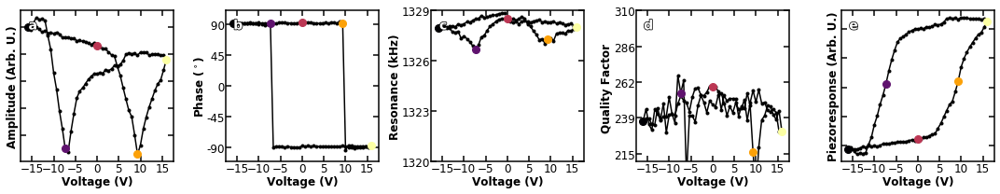

In [5]:
# (User) selects index (index used in main manuscript as example [30,30], cycle 2)
x = 30
y = 30
cycle = 2

# Sets the information for plotting. (User) can adjust scales.
signals = {'Amplitude': dict(
    symbol='A',
    format_str='%.0e',
    units='(Arb. U.)',
    y_lim=[],
    y_tick=[]),
    'Phase': dict(
    symbol='Phi',
    format_str='%3.d',
    units='(${^\circ}$)',
    y_lim=[-110, 110],
    y_tick=np.linspace(-90, 90, 5)),
    'Resonance': dict(
    symbol='w',
    format_str='%3.d',
    units='(kHz)',
    y_lim=[1326, 1329],
    y_tick=np.linspace(1320, 1329, 4)),
    'Quality Factor': dict(
    symbol='Q',
    format_str='%3.f',
    units='',
    y_lim=[210, 310],
    y_tick=np.linspace(215, 310, 5)),
    'Piezoresponse': dict(
    symbol='Piezoresponse',
    format_str='%.0e',
    units='(Arb. U.)',
    y_lim=[],
    y_tick=[])
}

sf.plot_raw_BE_data(x, y, cycle, data, signals, 'Raw_Loops_mixed')

# Reciprical Space Maps of PbZr${_{0.2}}$Ti${_{0.8}}$O${_{3}}$ with Hierarchical Domain Structures

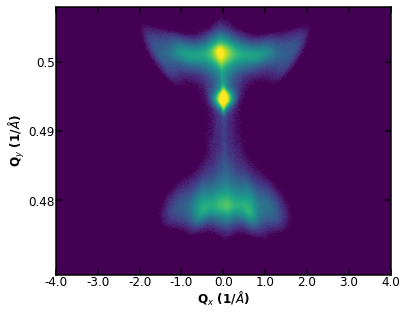

In [27]:
# Creates the figure and axes
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot(111)

# Plots the graph
Plt1 = ax1.imshow(np.flipud(np.log(data['vq'])), cmap='viridis')

# Formats the graph
Plt1.set_clim([3, 8])
ax1.set_xticks(np.linspace(0, 1000, 9))
ax1.set_xticklabels(np.linspace(-4, 4, 9))
ax1.set_yticks(np.linspace(777.77777 / 5, 777.7777777777778, 4))
ax1.set_ylim([1000, 200])
ax1.set_yticklabels(np.linspace(.51, .48, 4))
ax1.set_xlabel('Q${_x}$ (1/${\AA}$)')
ax1.set_ylabel('Q${_y}$ (1/${\AA}$)')
ax1.set_facecolor([0.26700401,  0.00487433,  0.32941519])

# Saves the figure
sf.savefig('RSM of PZT with Hierarchical Domain Structures', print_EPS=True)

# Principle Component Analysis

In [134]:
signal_info = {'Piezoresponse':dict(
                data_type = 'Piezoresponse',
                y_lim = [-0.29,.29],
                y_label = 'Piezoresponse (Arb. U.)'),
               'Amplitude':dict(
                data_type = 'Amplitude',
                y_lim = [-.2,.2],
                y_label = 'Amplitude (Arb. U.)'),
               'Phase':dict(
                data_type = 'Phase',
                y_lim = [-.3,.3],
                y_label = 'Phase (${^\circ}$)'),
                'Resonance':dict(
                data_type = 'Resonance',
                y_lim = [-.3,.3],
                y_label = 'Resonance (kHz)'),
                'Quality Factor':dict(
                data_type = 'Quality Factor',
                y_lim = [-.3,.3],
                y_label = 'Quality Factor (Arb. U.)')
              }

### PCA of Amplitude

In [135]:
import Support_Functions as sf
import imp
imp.reload(sf)

<module 'Support_Functions' from '/Users/joshuaagar/Google Drive/Berkeley_2017/Data_Analysis/Automatic_Analysis_of_Ferroelectric_Switching_Using_Deep_Recurrent_Neural_Networks/Support_Functions.py'>

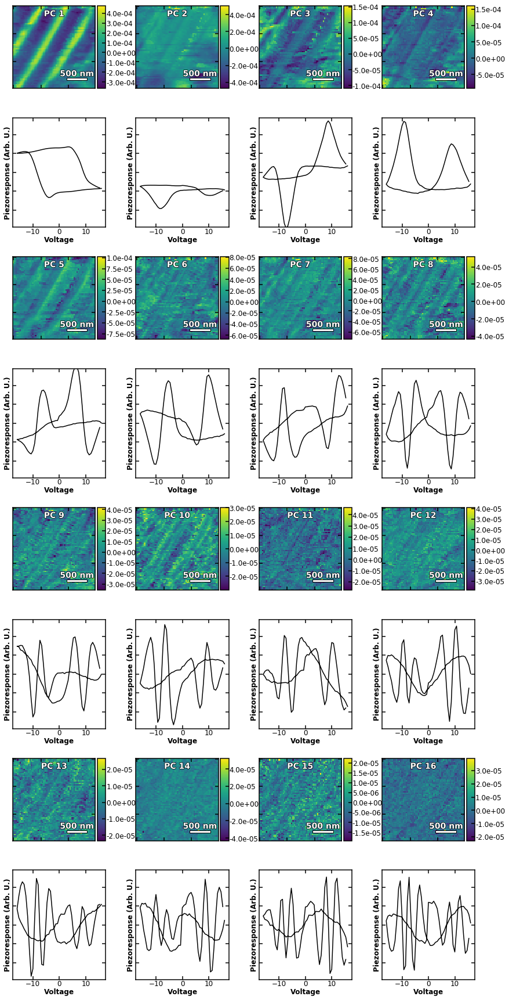

In [189]:


# Computes the PCA
# second index represents the number of components to compute
PCA_Piezoresponse, _ = sf.conduct_PCA(Piezoresponse,16)

sf.plot_pca_results(PCA_Piezoresponse,
                 Piezoresponse, voltage, signal_info['Piezoresponse'],
                 add_scalebar=[2000,500],
                 filename='./Mixed_PCA_Piezoresponse',
                 print_EPS=True)

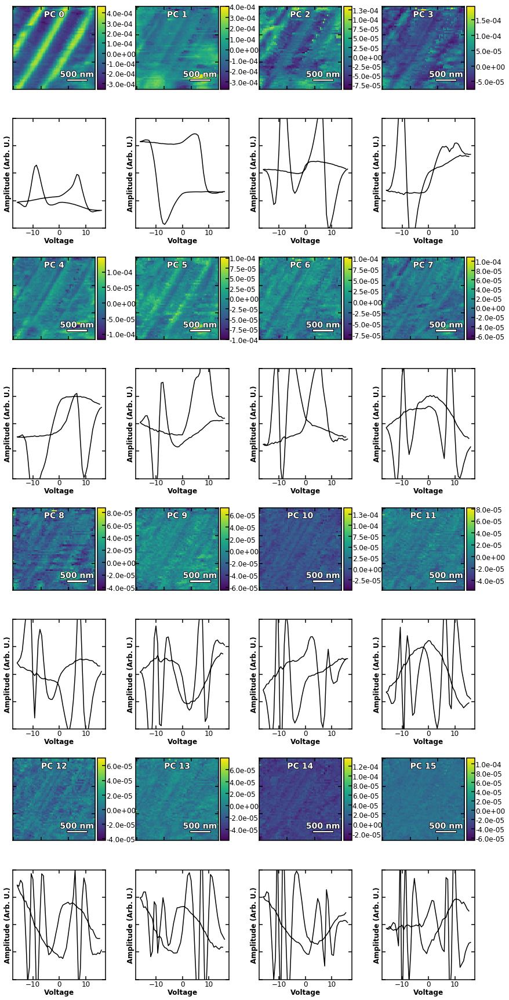

In [122]:
# Computes the PCA
# second index represents the number of components to compute
PCA_amplitude, _ = sf.conduct_PCA(Amplitude,16)

sf.plot_pca_results(PCA_amplitude,
                 Amplitude, voltage, signal_info['Amplitude'],
                 add_scalebar=[2000,500],
                 filename='./Mixed_PCA_Amplitude',
                 print_PNG=True)

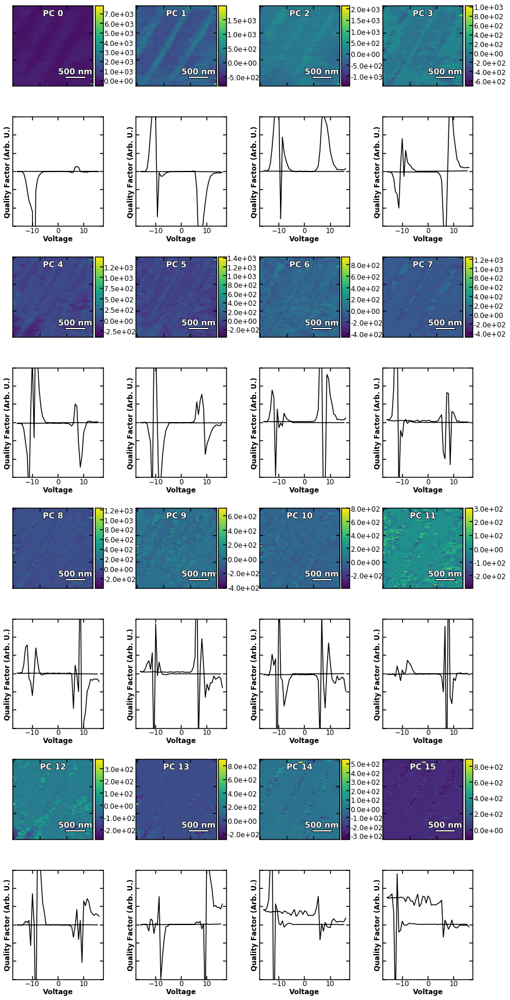

In [128]:
# Computes the PCA
# second index represents the number of components to compute
PCA_phase, _ = sf.conduct_PCA(Phase,16)

sf.plot_pca_results(PCA_phase,
                 Phase, voltage, signal_info['Phase'],
                 add_scalebar=[2000,500],
                 filename='./Mixed_PCA_Phase',
                 print_PNG=True)

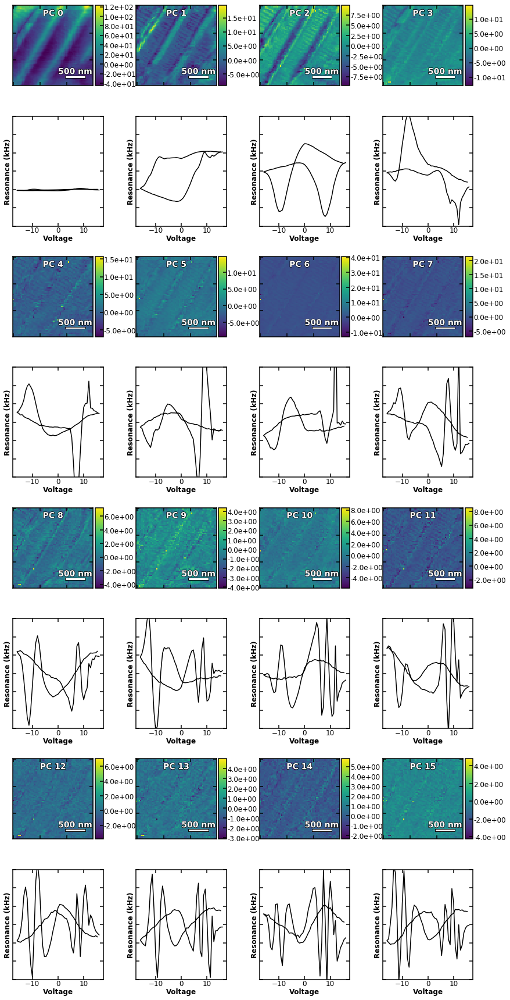

In [131]:
# Computes the PCA
# second index represents the number of components to compute
PCA_Resonance, _ = sf.conduct_PCA(resonance_filtered,16)

sf.plot_pca_results(PCA_Resonance,
                 resonance_filtered, voltage, signal_info['Resonance'],
                 add_scalebar=[2000,500],
                 filename='./Mixed_PCA_Resonance',
                 print_PNG=True)

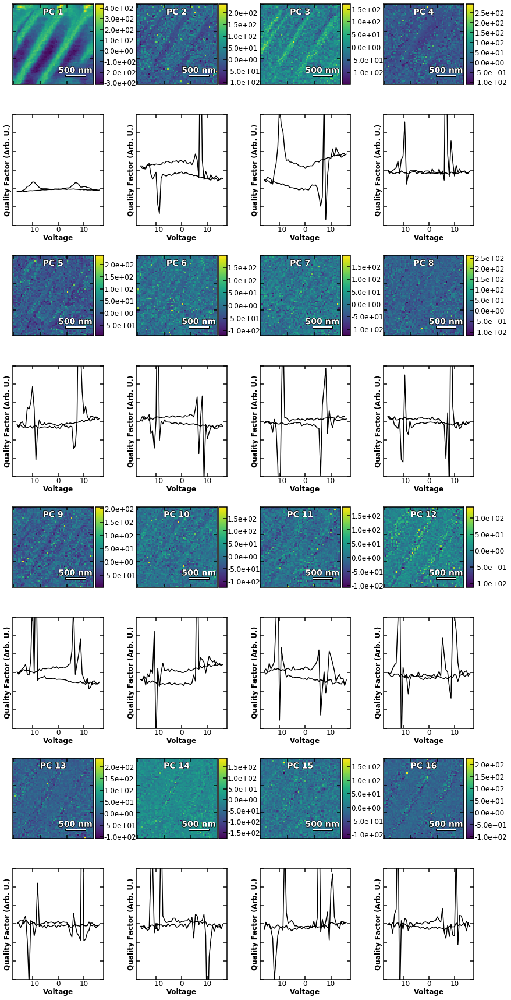

In [137]:
# Computes the PCA
# second index represents the number of components to compute
PCA_Quality, _ = sf.conduct_PCA(Quality,16)

sf.plot_pca_results(PCA_Quality,
                 Quality, voltage, signal_info['Quality Factor'],
                 add_scalebar=[2000,500],
                 filename='./Mixed_PCA_Quality',
                 print_PNG=True)

# Non-Negative Matrix Factorization

### Piezoresponse

In [170]:
model = NMF(n_components=16, init='random', random_state=0)
W = model.fit_transform(np.rollaxis(Piezo_norm - np.min(Piezo_norm),1))
NMF_Piezoresponse = np.rollaxis(model.components_,1)

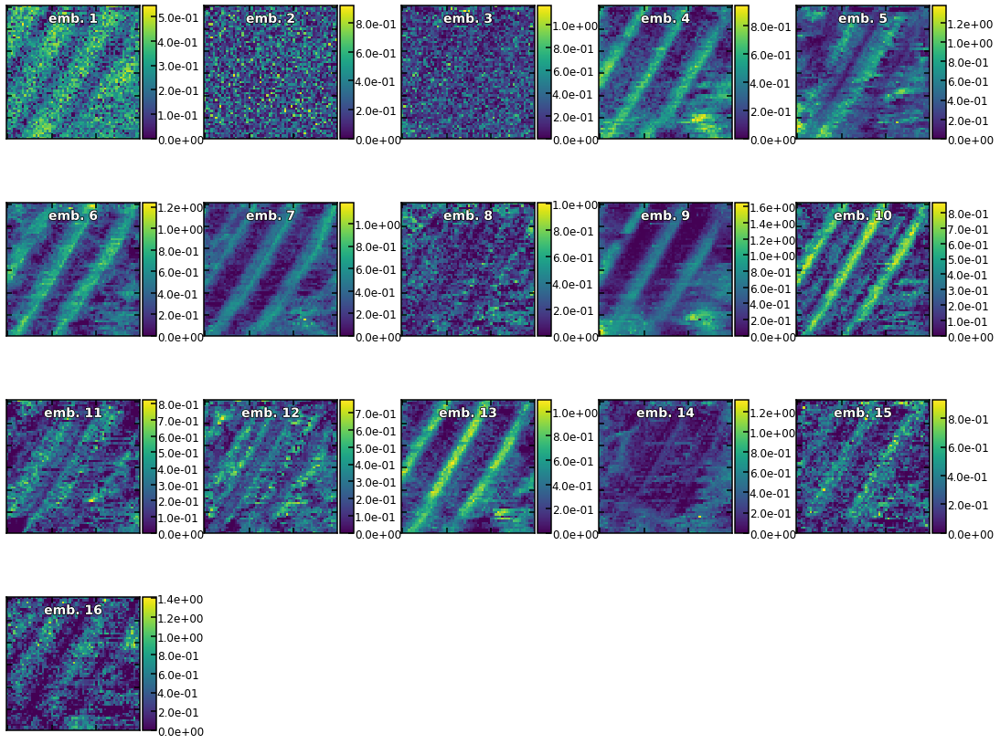

In [172]:
fig = sf.plot_embedding_maps(NMF_Piezoresponse)

### Resonance Frequency

In [169]:
model = NMF(n_components=16, init='random', random_state=0)
W = model.fit_transform(np.rollaxis(resonance_norm - np.min(resonance_norm),1))
NMF_Resonance = np.rollaxis(model.components_,1)

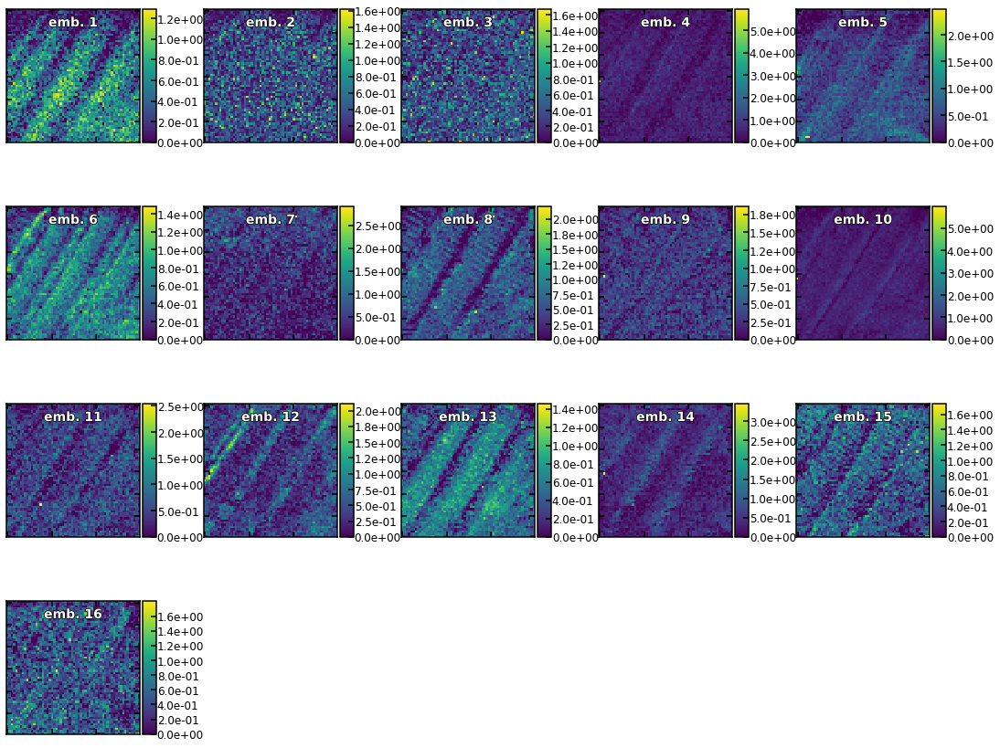

In [145]:
fig = sf.plot_embedding_maps(H)

# Clustering Results
## Piezoresponse
### Raw response

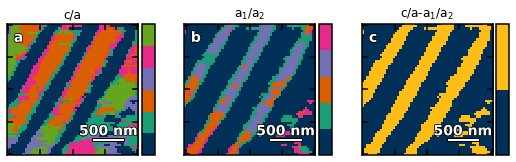

In [156]:
int_cluster = 2
num_c_cluster = 5
num_a_cluster = 4

np.random.seed(42)

combined_map_raw, cluster_ca_raw, c_map_raw, a_map_raw = sf.cluster_loops(Piezo_norm, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=42)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_raw, c_map_raw, a_map_raw, names)

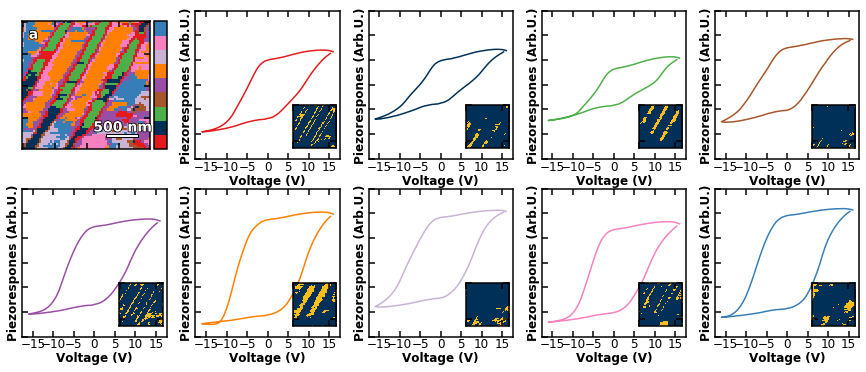

In [157]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_raw)

### PCA

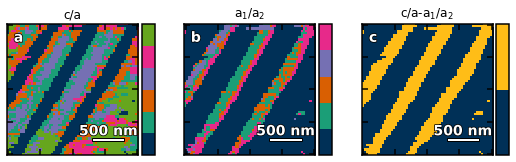

In [158]:
PCA_out = sf.pca_weights_as_embeddings(PCA_mixed, Piezoresponse)

combined_map_PCA, cluster_ca_PCA, c_map_PCA, a_map_PCA = sf.cluster_loops(PCA_out, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_PCA, c_map_PCA, a_map_PCA, names)

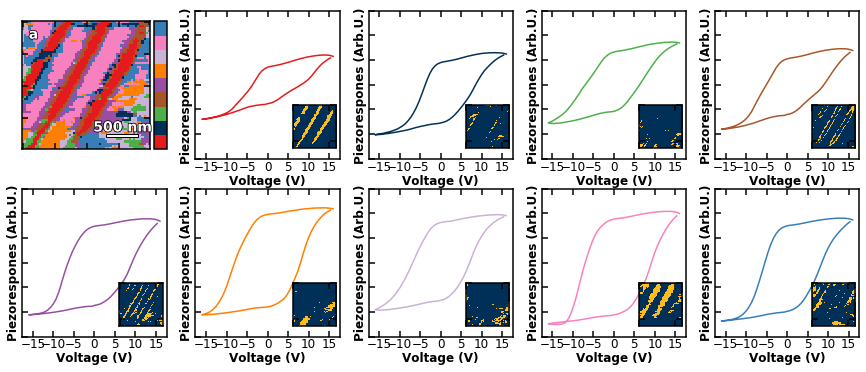

In [186]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_PCA)
sf.savefig('PCA_Cluster',print_EPS=True)

## Clustering Non-Negative Matrix Factorization

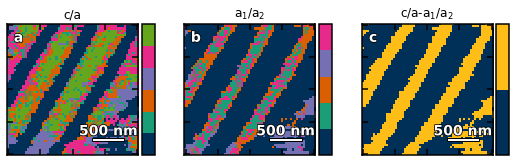

In [173]:
combined_map_NMF, cluster_ca_NMF, c_map_NMF, a_map_NMF = sf.cluster_loops(NMF_Piezoresponse, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_NMF, c_map_NMF, a_map_NMF, names)

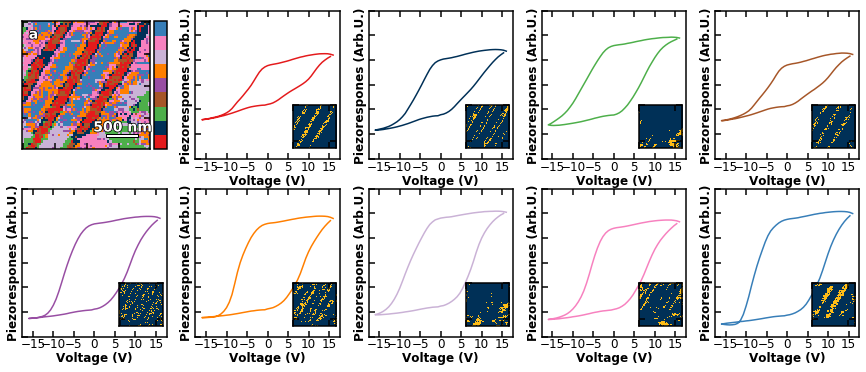

In [174]:
sf.plot_clustered_hysteresis(voltage, Piezoresponse, combined_map_NMF)

## Resonance Frequency
### Raw Response

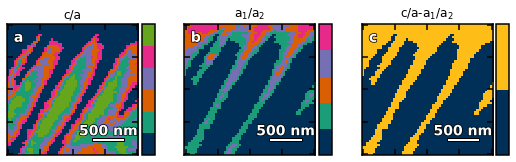

In [162]:
int_cluster = 2
num_c_cluster = 5
num_a_cluster = 4

np.random.seed(42)

combined_map_raw, cluster_ca_raw, c_map_raw, a_map_raw = sf.cluster_loops(resonance_norm, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=42)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_raw, c_map_raw, a_map_raw, names)

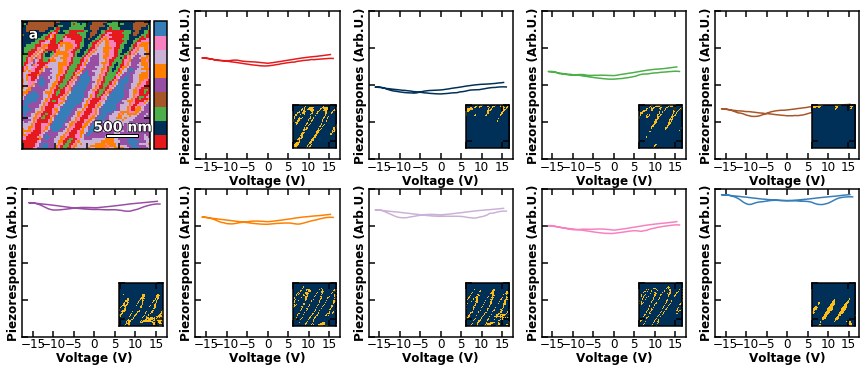

In [165]:
sf.plot_clustered_hysteresis(voltage, resonance_filtered, combined_map_raw, loop_ylim=[1310,1330])

### PCA

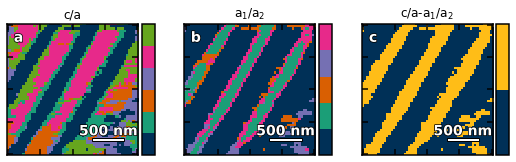

In [166]:
PCA_out = sf.pca_weights_as_embeddings(PCA_Resonance, Piezoresponse)

combined_map_PCA, cluster_ca_PCA, c_map_PCA, a_map_PCA = sf.cluster_loops(PCA_out, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_PCA, c_map_PCA, a_map_PCA, names)

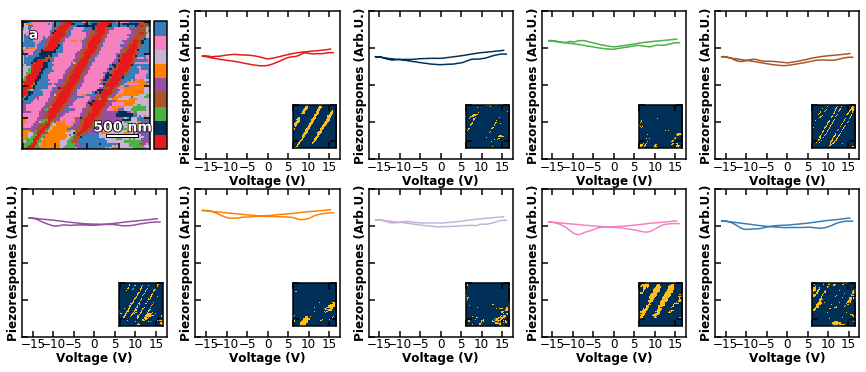

In [168]:
sf.plot_clustered_hysteresis(voltage, resonance_filtered, combined_map_PCA, loop_ylim=[1310,1330])
sf.savefig('PCA_Cluster',print_EPS=True)

## Clustering Non-Negative Matrix Factorization

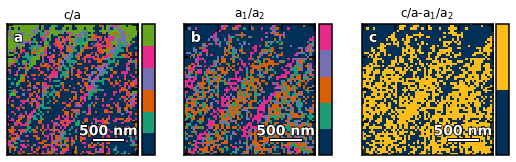

In [175]:
combined_map_NMF, cluster_ca_NMF, c_map_NMF, a_map_NMF = sf.cluster_loops(NMF_Resonance, int_cluster, 
                             num_c_cluster, num_a_cluster,
                             seed=48)

names = {('c/a-a${_1}$/a${_2}$','cluster_ca'),
         ('a${_1}$/a${_2}$','a_map'),('c/a','c_map')} 

sf.plot_hierachical_cluster_maps(cluster_ca_NMF, c_map_NMF, a_map_NMF, names)

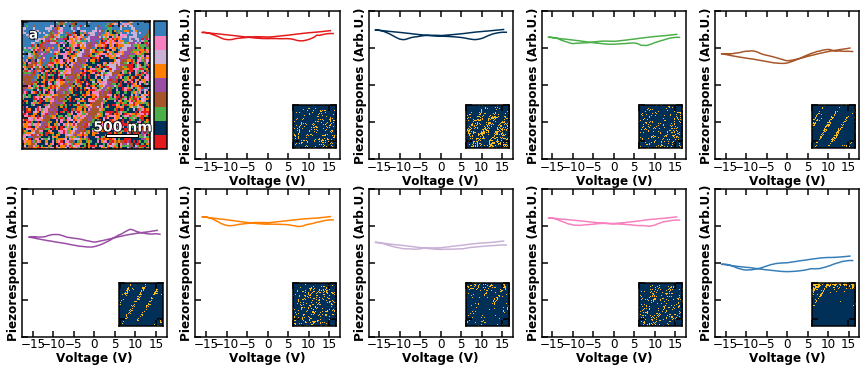

In [177]:
sf.plot_clustered_hysteresis(voltage, resonance_filtered, combined_map_NMF, loop_ylim=[1310,1330])

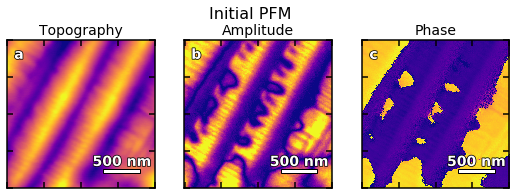

In [183]:
# (User) Sets the colorscale of [topography = (initial [-3e-9,3e-9]),
#amplitude (initial [.5e-11,6.5e-11]),
# phase (initial [40,260])]
signal_clim = {'Topography': dict(
    c_lim=[-3e-9, 3e-9],
    data_loc='HeightOriginal'),
    'Amplitude': dict(
    c_lim=[.5e-11, 6.5e-11],
    data_loc='AmpOriginal'),
    'Phase': dict(
    c_lim=[40, 260],
    data_loc='PhaseOriginal')
}

# Defines the figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(9, 3))

# Adds title to the figure
fig.suptitle('Initial PFM', fontsize=16,
             y=1, horizontalalignment='center')

# Plots each of the graphs
for i, (signal, values) in enumerate(signal_clim.items()):

    # Plots the graph
    im = axes[i].imshow(np.flipud(data[values['data_loc']].T), cmap='plasma')

    # Sets the scales
    im.set_clim(values['c_lim'])

    # Adds titles to the graphs
    axes[i].set_title(signal, fontsize=14)

    # labels figures
    sf.labelfigs(axes[i], i)

    # Removes axis labels
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])

    # Sets ticks
    axes[i].set_xticks(np.linspace(0, 1024, 5))
    axes[i].set_yticks(np.linspace(0, 1024, 5))

    sf.add_scalebar_to_figure(axes[i], 2000, 500)

sf.savefig('Initial_PFM_mixed')

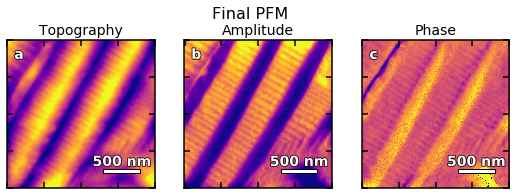

In [185]:
# (User) Sets the colorscale of [topography = (initial [-3e-9,3e-9]),
#amplitude (initial [.2e-10,1.5e-10]),
# phase (initial [50,90])]
signal_clim = {'Topography': dict(
    c_lim=[-2e-9, 2e-9],
    data_loc='HeightFinal'),
    'Amplitude': dict(
    c_lim=[.2e-10, 1.5e-10],
    data_loc='AmpFinal'),
    'Phase': dict(
    c_lim=[50, 90],
    data_loc='PhaseFinal')
}

# Defines the figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(9, 3))

# Adds title to the figure
fig.suptitle('Final PFM', fontsize=16,
             y=1, horizontalalignment='center')

# Plots each of the graphs
for i, (signal, values) in enumerate(signal_clim.items()):

    # Plots the graph
    im = axes[i].imshow(np.flipud(data[values['data_loc']].T), cmap='plasma')

    # Sets the scales
    im.set_clim(values['c_lim'])

    # Adds titles to the graphs
    axes[i].set_title(signal, fontsize=14)

    # labels figures
    sf.labelfigs(axes[i], i)

    # Removes axis labels
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])

    # Sets ticks
    axes[i].set_xticks(np.linspace(0, 1024, 5))
    axes[i].set_yticks(np.linspace(0, 1024, 5))

    sf.add_scalebar_to_figure(axes[i], 2000, 500)

sf.savefig('Final_PFM_Mixed')

# Autoencoder Analysis

In [25]:
# loads the model
piezoresponse_model = keras.models.load_model('Trained_Model_Piezoresponse')

# This function can generate new activations from low dimensional 
# layer or load a precomputed file
piezoresponse_embeddings = sf.get_activations('Trained_Model_Piezoresponse_Embeddings.npy')

model Trained_Model_Piezoresponse_Embeddings.npy loaded from saved file


In [26]:
# Displays a summary of the network structure
piezoresponse_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_19 (Bidirectio (None, 96, 64)            8704      
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 96, 64)            24832     
_________________________________________________________________
bidirectional_21 (Bidirectio (None, 96, 64)            24832     
_________________________________________________________________
bidirectional_22 (Bidirectio (None, 96, 64)            24832     
_________________________________________________________________
bidirectional_23 (Bidirectio (None, 64)                24832     
_________________________________________________________________
encoding (Dense)             (None, 16)                1040      
_________________________________________________________________
repeat_vector_7 (RepeatVecto (None, 96, 16)            0         
__________

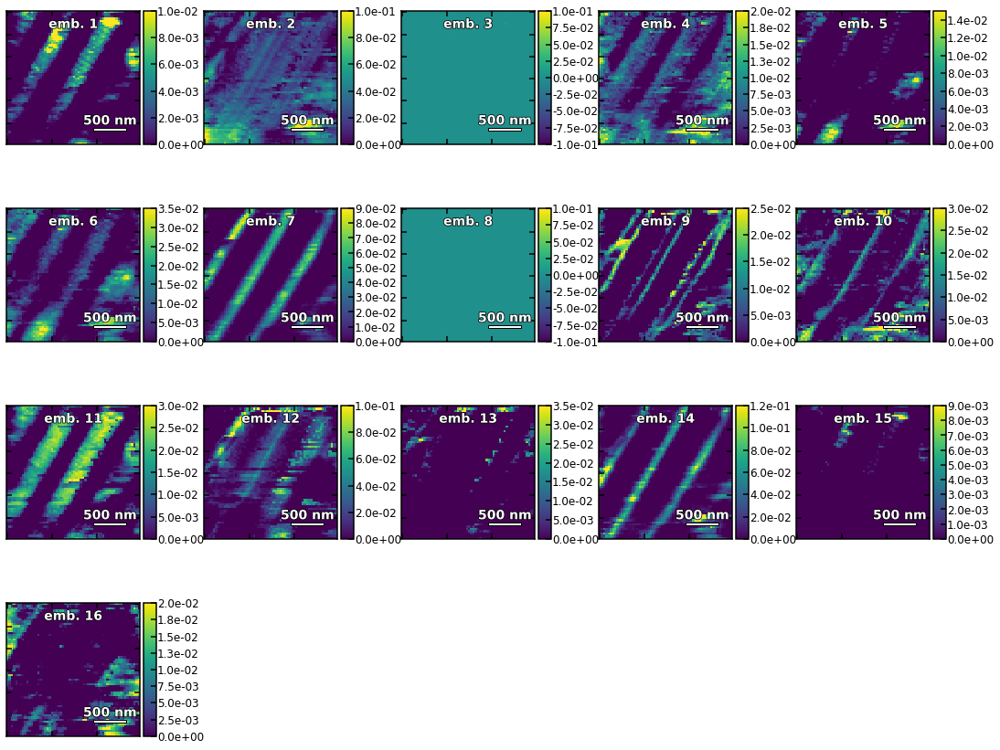

In [28]:
# defines the ranges for the images
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]

# plots the low dimensional embedding maps
_ = sf.plot_embedding_maps(piezoresponse_embeddings,add_scalebar=[2000,500],print_EPS=True, filename='./Piezoresponse_embeddings',
                          ranges=ranges)

# Builds a Model to use Autoencoder as a Generator

In [59]:
# builds the identical encoding model
model_decode_Piezo = Sequential()
model_decode_Piezo.add(RepeatVector(96,input_shape=(16,)))
model_decode_Piezo.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode_Piezo.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode_Piezo.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode_Piezo.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode_Piezo.add(Bidirectional(LSTM(32, return_sequences=True, dropout=.2)))
model_decode_Piezo.add(TimeDistributed(Dense(1, activation='linear')))

# Sets the layers to match the training model
model_decode_Piezo.layers[1].set_weights((piezoresponse_model.layers[7].get_weights()))
model_decode_Piezo.layers[2].set_weights((piezoresponse_model.layers[8].get_weights()))
model_decode_Piezo.layers[3].set_weights((piezoresponse_model.layers[9].get_weights()))
model_decode_Piezo.layers[4].set_weights((piezoresponse_model.layers[10].get_weights()))
model_decode_Piezo.layers[5].set_weights((piezoresponse_model.layers[11].get_weights()))
model_decode_Piezo.layers[6].set_weights((piezoresponse_model.layers[12].get_weights()))

model_decode_Piezo.compile(Adam(3e-5), loss='mse')

# Makes Generative Maps for the Piezoresponse

  2%|▎         | 5/200 [03:38<2:21:24, 43.51s/it]

KeyboardInterrupt: 

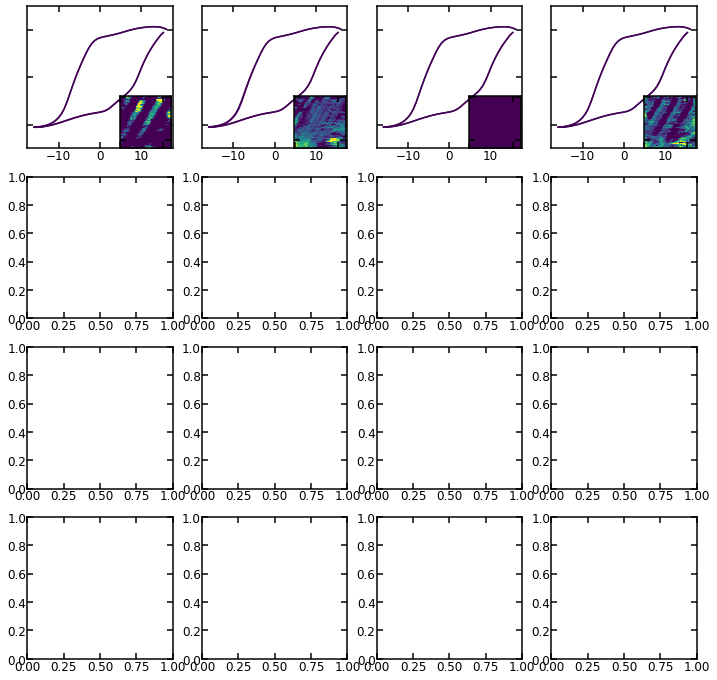

In [46]:
# sets the number of plots
graph = 16
# sets the number of rows
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

# number of loops to print
number = 200

# defines the ranges
ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]

# preallocates the vector
ave_embed = np.zeros((16))

# makes folder
folder = sf.Make_folder('Generated_Piezoresponse_Loops')

for j in tqdm(range(number)):
    
    # builds the figure
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    for i in range(16):
        
        # builds an average vector for the embedding layer
        values = np.repeat(ave_embed,number).reshape(16,number).T
        # sets the selected embedding value between the range
        values[:,i] = np.linspace(0,ranges[i],number)
        
        generated = model_decode_Piezo.predict(np.atleast_2d(values)).squeeze()
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-1.5,1.5)
        ax[i].set_yticklabels('')
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        pos = ax[i].get_position()
        
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0+.107, pos.y0,.06, .06])
        axes_in.imshow(embeddings[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    #print(j)
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

In [48]:
# sets the filename for the movie
gif_name = 'Piezoresponse_Generator'

# sets the framerate
fps = 16

# searches the folder and finds the files
file_list = glob.glob('./Generated_Piezoresponse_Loops/*.png') 

# Sorts the files by number makes 2 lists to go forward and back
list.sort(file_list) 
file_list_rev = glob.glob('./Generated_Piezoresponse_Loops/*.png')
list.sort(file_list_rev,reverse=True)
new_list = file_list + file_list_rev

# makes an animated gif from the images
clip = mpy.ImageSequenceClip(new_list, fps=fps)
clip.write_gif('{}.gif'.format(gif_name), fps=fps)


[MoviePy] Building file Piezoresponse_Generator.gif with imageio



100%|█████████▉| 400/401 [07:17<00:01,  1.02s/it]


# Visualizing Autoencoder Results

In [ ]:
# sets the number of plots
graph = 7*19*214

# sets the number of rows
mod = 7

# makes the figure
fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                     figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
ax = ax.reshape(-1)

# defines the ranges for the images
pe_ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]
resonance_ranges = [0,0.01,0.0035,0,.004,0,.02,0,0,.004, 0,0, 0, 0, 0, 0]
count = 0

# plots the piezoelectric loops
for i, value in enumerate(pe_ranges):
    if value ==0:  
        pass
    else:
        ax[14*count].imshow(piezoresponse_embeddings[:,i].reshape(60,60), clim=[0,value])
        ax[14*count].set_yticklabels('')
        ax[14*count].set_xticklabels('')
        count += 1
        
# plots the resonance loops
for i, value in enumerate(resonance_ranges):
    if value ==0:  
        pass
    else:
        ax[14*count].imshow(resonance_embeddings[:,i].reshape(60,60), clim=[0,value])
        ax[14*count].set_yticklabels('')
        ax[14*count].set_xticklabels('')
        count += 1

# Resonance Frequency Autoencoder

In [30]:
resonance_model = keras.models.load_model('Trained_Model_Resonance.hdf5')

resonance_embeddings = sf.get_activations(resonance_model, np.atleast_3d(resonance_scaled),2)

In [31]:
resonance_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_4 (Bidirection (None, 96, 256)           133120    
_________________________________________________________________
bidirectional_5 (Bidirection (None, 256)               394240    
_________________________________________________________________
encoding (Dense)             (None, 16)                4112      
_________________________________________________________________
repeat_vector_2 (RepeatVecto (None, 96, 16)            0         
_________________________________________________________________
bidirectional_6 (Bidirection (None, 96, 256)           148480    
_________________________________________________________________
bidirectional_7 (Bidirection (None, 96, 256)           394240    
_________________________________________________________________
time_distributed_2 (TimeDist (None, 96, 1)             257       
Total para

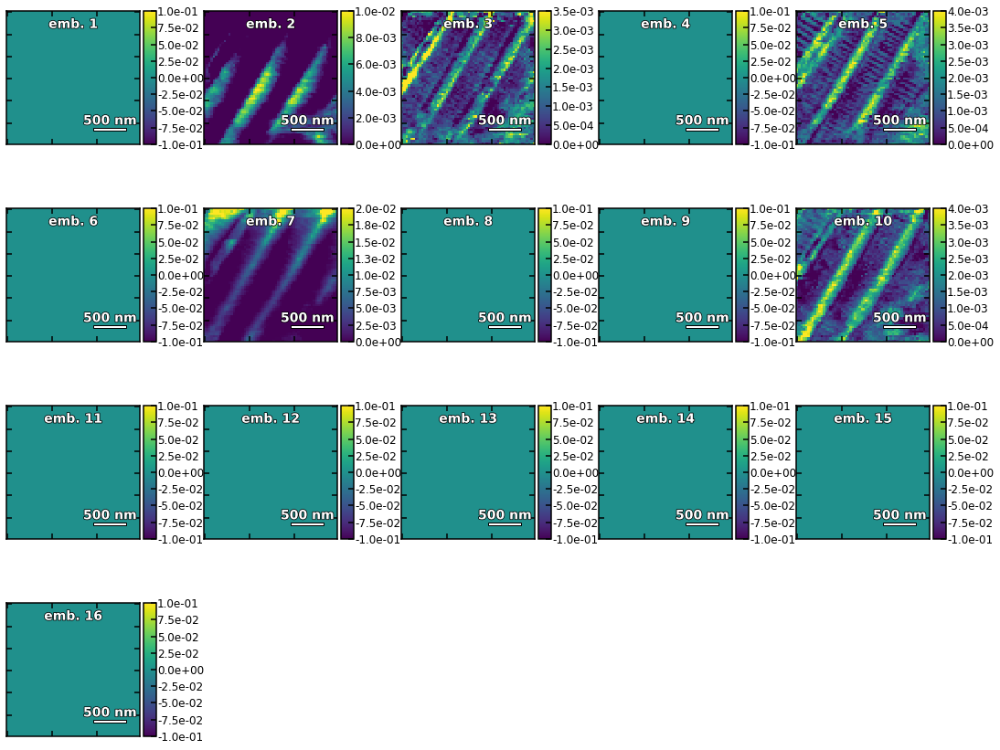

In [37]:
# defines the ranges
ranges = [0,0.01,0.0035,0,.004,0,.02,0,0,.004, 0,0, 0, 0, 0, 0]

_ = sf.plot_embedding_maps(resonance_embeddings,add_scalebar=[2000,500],print_EPS=True, 
                       filename='./resonance_embedding',ranges=ranges)

In [39]:
# builds the resonance decoding model
resonance_decode = Sequential()
resonance_decode.add(RepeatVector(96,input_shape=(16,)))
resonance_decode.add(Bidirectional(LSTM(128, return_sequences=True),input_shape=(96, 1)))
resonance_decode.add(Bidirectional(LSTM(128, return_sequences=True),input_shape=(96, 1)))
resonance_decode.add(TimeDistributed(Dense(1, activation='linear')))

# Sets the layers to match the training model
resonance_decode.layers[1].set_weights((resonance_model.layers[4].get_weights()))
resonance_decode.layers[2].set_weights((resonance_model.layers[5].get_weights()))
resonance_decode.layers[3].set_weights((resonance_model.layers[6].get_weights()))


resonance_decode.compile(Adam(3e-5), loss='mse')

 90%|█████████ | 45/50 [08:07<00:57, 11.46s/it]

KeyboardInterrupt: 

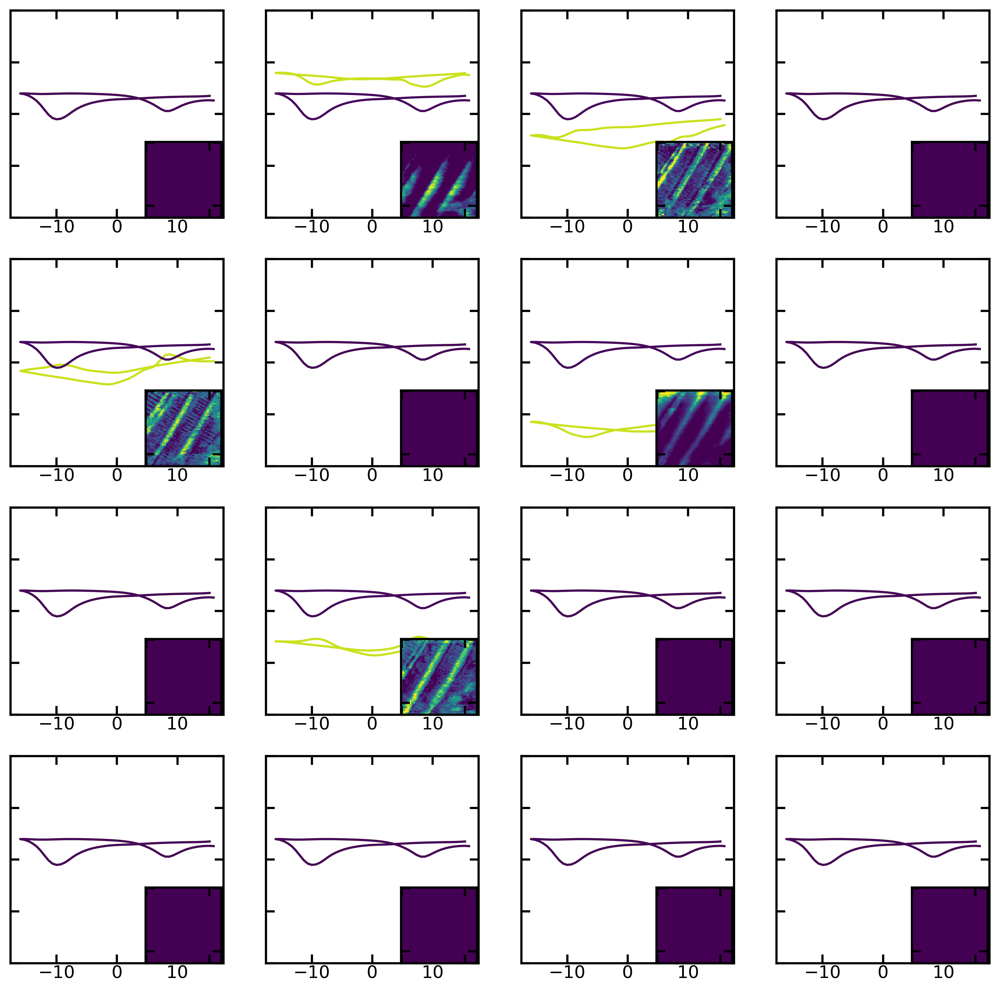

In [43]:
# sets the number of plots
graph = 16

# sets the number of rows
mod = 4

# Defines the colorlist
cmap = plt.get_cmap('viridis')

# number of loops to print
number = 50

# defines the ranges
ranges = [0,0.01,0.0035,0,.004,0,.02,0,0,.004, 0,0, 0, 0, 0, 0]

# preallocates the vector
ave_embed = np.zeros((16))

# makes folder
folder = sf.Make_folder('Generated_Resonance_Loops')

for j in tqdm(range(number)):
    
    # makes the figure
    fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                         figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
    ax = ax.reshape(-1)
    
    # builds encoding values
    values = np.repeat(ave_embed,number).reshape(16,number).T

    for i in range(16):
        
        # computes the mean embedding values within a specific range
        for k in range(number):
            value = np.linspace(0,ranges[i],number)
            idx = (resonance_embeddings[:, i]>value[k-1])*(resonance_embeddings[:, i]<value[k])
            index = np.where(idx)
            if not any(idx): 
                values[k,:] = np.zeros((16))
            else:
                values[k,:] = np.mean(resonance_embeddings[index],axis=0)
        
        # generates the decoding model
        generated = resonance_decode.predict(np.atleast_2d(values)).squeeze()
        
        # plots the generated loops
        ax[i].plot(voltage, generated[j,:], color = cmap((j+1)/number))
        ax[i].set_ylim(-4,4)
        ax[i].set_yticklabels('')
        ax[i].plot(voltage, generated[0,:], color = cmap((0+1)/number))
        
        # gets the position of the axis
        pos = ax[i].get_position()
        
        # plots and formats the binary cluster map
        axes_in = plt.axes([pos.x0+.107, pos.y0,.06, .06])
        axes_in.imshow(out_data[:, i].reshape(60, 60), clim=[0,ranges[i]])
        axes_in.set_yticklabels('')
        axes_in.set_xticklabels('')
    
    sf.savefig(pjoin(folder,f'{j:04d}_maps'),print_PNG=True)
    plt.close(fig)

In [41]:
# sets the filename for the movie
gif_name = 'Resonance_Generator'

# sets the framerate
fps = 16

# searches the folder and finds the files
file_list = glob.glob('./Generated_Resonance_Loops/*.png') 

# Sorts the files by number makes 2 lists to go forward and back
list.sort(file_list) 
file_list_rev = glob.glob('./Generated_Resonance_Loops/*.png')
list.sort(file_list_rev,reverse=True)
new_list = file_list + file_list_rev

# makes an animated gif from the images
clip = mpy.ImageSequenceClip(new_list, fps=fps)
clip.write_gif('{}.gif'.format(gif_name), fps=fps)


[MoviePy] Building file Resonance_Generator.gif with imageio


 99%|█████████▉| 100/101 [01:43<00:01,  1.11s/it]


# Combined graphs

In [187]:
def plot_analysis_maps(ax, embeddings, ranges, count):
    # plots the piezoelectric loops
    for i, value in enumerate(ranges):
        if value ==0:  
            pass
        else:
            sf.plot_imagemap(ax[4*count], embeddings[:,i], clim=[0,value])

            split_range = np.linspace(0,value,number)
            split_range = np.append(split_range, np.max(embeddings[:,i]))
            selection_map = np.zeros((3600))
            
            for j in range(len(split_range)-1):
                ind = np.where(np.logical_and(embeddings[:, i]>split_range[j],
                                              embeddings[:, i]<split_range[j+1]))
                selection_map[ind] = j + 1
                
                ax[count*4+2].plot(voltage,np.mean(Piezoresponse[ind],axis=0), color = cmap((j+1)/number))
                ax[count*4+2].set_ylim([-.15e-3,.15e-3])
                ax[count*4+2].set_yticklabels('')
                ax[count*4+2].set_ylabel('Piezoresponse (Arb. U.)')
                ax[count*4+2].set_xlabel('Voltage (V)')
                
                ax[count*4+3].plot(voltage,np.mean(resonance_filtered[ind],axis=0), color = cmap((j+1)/number))
                ax[count*4+3].set_ylim([1320,1332])
                ax[count*4+3].set_yticklabels('')
                ax[count*4+3].set_ylabel('Resonance (kHz)')
                ax[count*4+3].set_xlabel('Voltage (V)')
            
            sf.plot_imagemap(ax[4*count+1], selection_map)
            
            count += 1
            
    return count

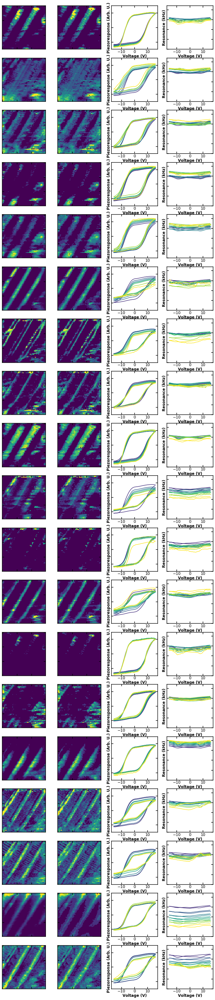

In [173]:
# sets the number of plots
graph = 4*19

# sets the number of rows
mod = 4

# sets the number of divisions
number = 7

# makes the figure
fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                     figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
ax = ax.reshape(-1)

# defines the ranges for the images
pe_ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]
resonance_ranges = [0,0.01,0.0035,0,.004,0,.02,0,0,.004, 0,0, 0, 0, 0, 0]
count = 0

count = plot_analysis_maps(ax, piezoresponse_embeddings, pe_ranges, count)
count = plot_analysis_maps(ax, resonance_embeddings, resonance_ranges, count)

sf.savefig('analysis_maps',print_PNG=True, print_EPS=True)

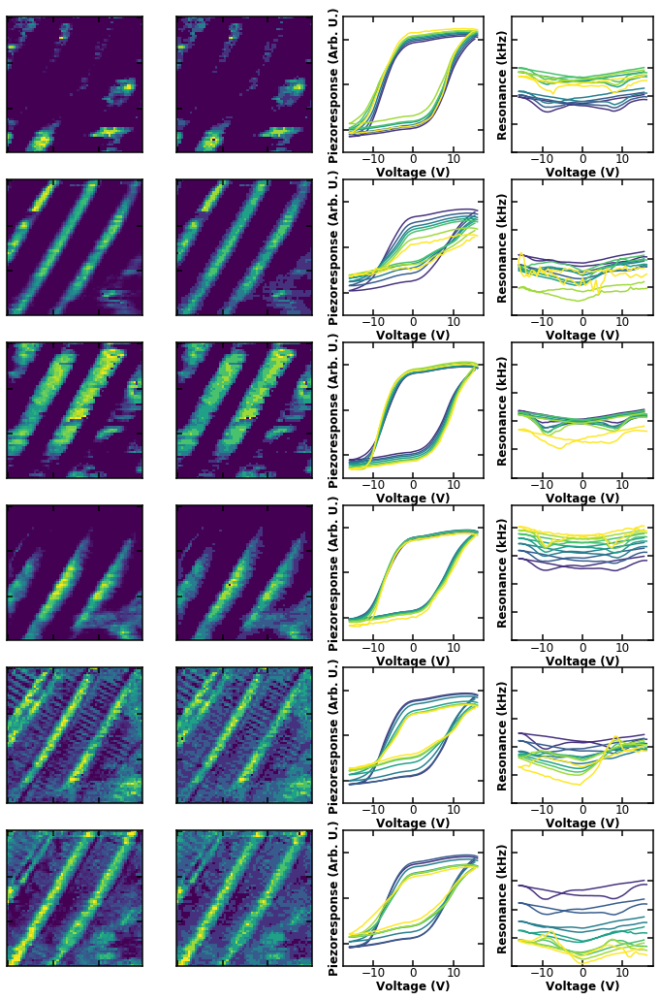

In [189]:
# sets the number of plots
graph = 4*6

# sets the number of rows
mod = 4

# sets the number of divisions
number = 7

# makes the figure
fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                     figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
ax = ax.reshape(-1)

# defines the ranges for the images
pe_ranges = [0,0,0,0,.015,0,.09,
             0,0,0,.03,0,0,0,0,0]
resonance_ranges = [0,0.01,0,0,.004,0,0,0,0,.004, 0,0, 0, 0, 0, 0]
count = 0

count = plot_analysis_maps(ax, piezoresponse_embeddings, pe_ranges, count)
count = plot_analysis_maps(ax, resonance_embeddings, resonance_ranges, count)

sf.savefig('analysis_maps_small',print_PNG=True, print_EPS=True)

In [145]:
split_range
split_range = np.append(np.max(piezoresponse_embeddings[:,i]))

TypeError: append() missing 1 required positional argument: 'values'

In [117]:
def plot_analysis_maps(ax, embeddings, ranges, count):
    # plots the piezoelectric loops
    for i, value in enumerate(ranges):
        if value ==0:  
            pass
        else:
            sf.plot_imagemap(ax[12*count], embeddings[:,i], clim=[0,value])

            split_range = np.linspace(0,np.max(embeddings[:,i]),number)
            selection_map = np.zeros((3600))

            for j in range(number-1):
                ind = np.where(np.logical_and(embeddings[:, i]>split_range[j],
                                              embeddings[:, i]<split_range[j+1]))
                selection_map[ind] = j + 1                
                
                ax[12*count+j+1].plot(voltage,np.mean(Piezoresponse[ind],axis=0), color = cmap((j+1)/number))
                ax[12*count+j+7].plot(voltage,np.mean(resonance_scaled[ind],axis=0), color = cmap((j+1)/number))

            sf.plot_imagemap(ax[12*count+6], selection_map)
            
            count += 1
            
    return count

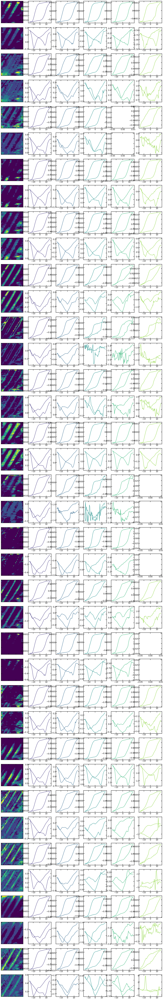

In [118]:
# sets the number of plots
graph = 6*19*2

# sets the number of rows
mod = 6

# sets the number of divisions
number = 6

# makes the figure
fig, ax = plt.subplots(graph // mod + (graph % mod > 0), mod,
                     figsize=(3 * mod, 3 * (graph // mod + (graph % mod > 0))))
ax = ax.reshape(-1)

# defines the ranges for the images
pe_ranges = [0.01,0.1,0,0.02,.015,0.035,.09,0,0.025,.03,.03,.1,.035,.12,.009,.02]
resonance_ranges = [0,0.01,0.0035,0,.004,0,.02,0,0,.004, 0,0, 0, 0, 0, 0]
count = 0

count = plot_analysis_maps(ax, piezoresponse_embeddings, pe_ranges, count)
count = plot_analysis_maps(ax, resonance_embeddings, resonance_ranges, count)

In [88]:
def plot_imagemap(axis, data, clim=None):

        """
        Plots an imagemap

        Parameters
        ----------
        axis : matplotlib, object
            axis which is plotted
        data  : numpy, float
            data to plot
        clim  : numpy, float, optional
            sets the climit for the image
        """
        if data.ndim == 1:
            data = data.reshape(np.sqrt(data.shape[0]).astype(int), np.sqrt(data.shape[0]).astype(int))

        print(data.shape)
        if clim is None:
            axis.imshow(data)
        else:
            axis.imshow(data, clim = clim)

        axis.set_yticklabels('')
        axis.set_xticklabels('')

60